In [2]:
from pathlib import Path
from matplotlib import pyplot as plt

PROJ_DIR = Path()

plt.style.use('seaborn-v0_8-whitegrid')
plt.rc('figure', autolayout=True, figsize=(12, 4))
plt.rc('axes', titleweight='bold')
plot_params = dict(
    color="0.75",
    style=".-",
    markeredgecolor="0.25",
    markerfacecolor="0.25",
    legend=False,
)

In [67]:
import pandas as pd

dtype = {
    "store_nbr": "category",
    "family": "category",
    "sales": "float32",
    "onpromotion": "uint64",
}
store_sales = pd.read_csv(
    PROJ_DIR / "dataset" / "train.csv",
    dtype=dtype,
    parse_dates=["date"],
    infer_datetime_format=True,
)
oil_prices = pd.read_csv(
    PROJ_DIR / "dataset" / "oil.csv",
    parse_dates=["date"],
    infer_datetime_format=True,
).set_index("date").to_period("D").fillna(0.0)

display(store_sales)
store_sales = store_sales.set_index("date").to_period("D")
store_exp = store_sales.copy()
store_sales = store_sales.set_index(["store_nbr", "family"], append=True)
store_sales.loc[("2013-12-01", "7"), :]

,id,date,store_nbr,family,sales,onpromotion
0,0,2013-01-01,1,AUTOMOTIVE,0.000000,0
1,1,2013-01-01,1,BABY CARE,0.000000,0
2,2,2013-01-01,1,BEAUTY,0.000000,0
3,3,2013-01-01,1,BEVERAGES,0.000000,0
4,4,2013-01-01,1,BOOKS,0.000000,0
...,...,...,...,...,...,...
3000883,3000883,2017-08-15,9,POULTRY,438.132996,0
3000884,3000884,2017-08-15,9,PREPARED FOODS,154.552994,1
3000885,3000885,2017-08-15,9,PRODUCE,2419.729004,148
3000886,3000886,2017-08-15,9,SCHOOL AND OFFICE SUPPLIES,121.000000,8


,id,sales,onpromotion
family,,,
AUTOMOTIVE,596871,0.000000,0
BABY CARE,596872,0.000000,0
BEAUTY,596873,3.000000,0
BEVERAGES,596874,2611.000000,0
BOOKS,596875,0.000000,0
BREAD/BAKERY,596876,615.013977,0
CELEBRATION,596877,0.000000,0
CLEANING,596878,1086.000000,0
DAIRY,596879,1277.000000,0


,sales,onpromotion
sales,1.000000,0.574943
onpromotion,0.574943,1.000000


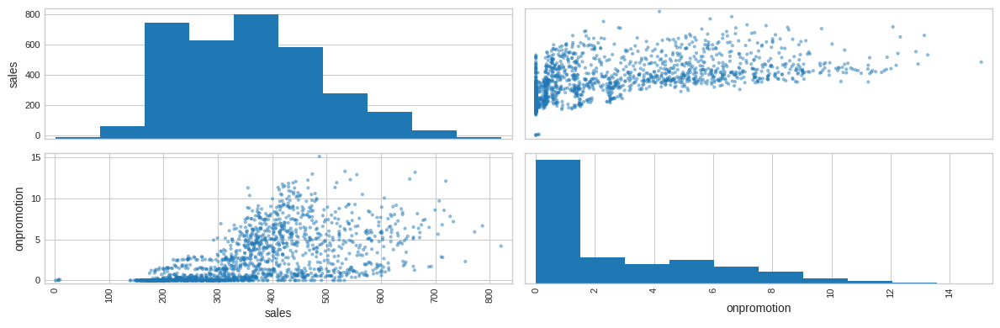

In [18]:
average_feats = store_sales.groupby("date").mean()[["sales", "onpromotion"]]
display(average_feats.corr())
pd.plotting.scatter_matrix(average_feats);

In [44]:
average_sales = average_feats["sales"]
average_sales

date
2013-01-01      1.409438
2013-01-02    278.390808
2013-01-03    202.840195
2013-01-04    198.911163
2013-01-05    267.873260
                 ...    
2017-08-11    463.733856
2017-08-12    444.798309
2017-08-13    485.768616
2017-08-14    427.004730
2017-08-15    427.980896
Freq: D, Name: sales, Length: 1684, dtype: float32

<Axes: title={'center': 'Average'}, xlabel='date'>

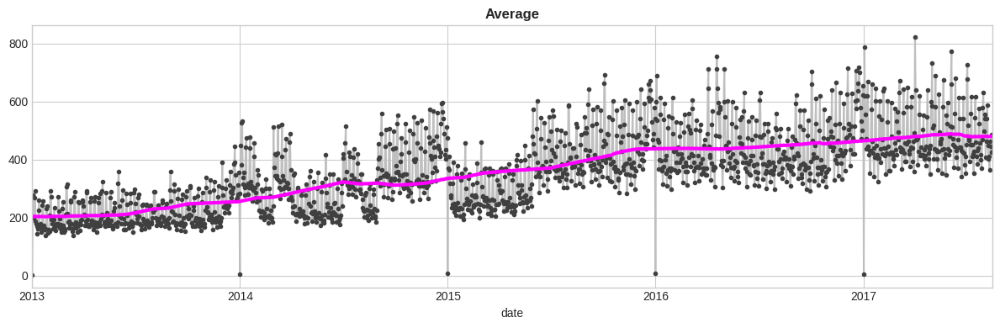

In [6]:
sales_ax = average_sales.plot(**plot_params, title="Average")
average_sales.rolling(window=365, min_periods=135, center=True).mean().plot(
    ax=sales_ax, linewidth=3, color="magenta"
)

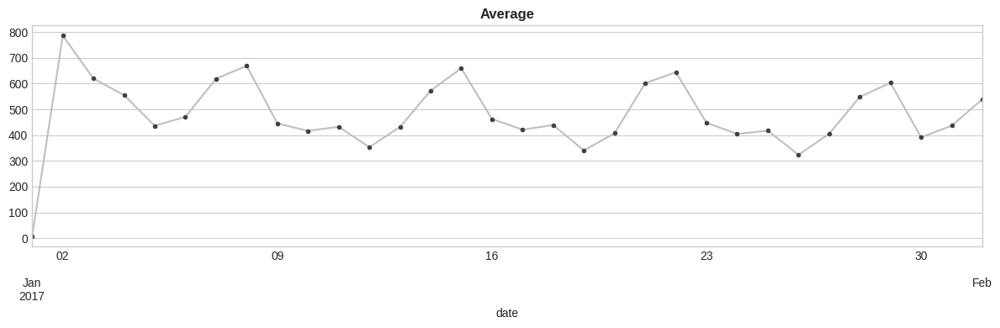

In [7]:
average_sales.loc["2017-01":"2017-02-01"].plot(**plot_params, title="Average");

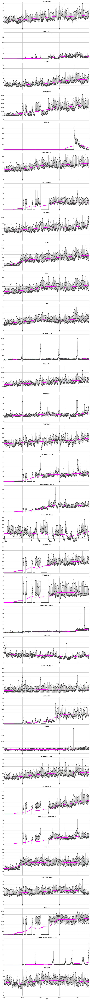

In [8]:
average_products = store_sales.groupby(["date", "family"]).mean()["sales"]
cats = average_products.index.get_level_values(1).categories
fig, axes = plt.subplots(len(cats), 1, sharex=True, figsize=(12, 4 * len(cats)))
for ax, cat in zip(axes, cats):
    average_products.loc[(slice(None), cat)].plot(ax=ax, **plot_params)
    average_products.loc[(slice(None), cat)].rolling(
        window=365, min_periods=135, center=True
    ).mean().plot(ax=ax, linewidth=3, color="magenta")
    ax.set_title(cat)

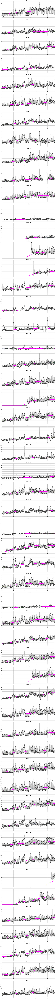

In [9]:
average_stores = store_sales.groupby(["date", "store_nbr"]).mean()["sales"]
cats = average_stores.index.get_level_values(1).categories
fig, axes = plt.subplots(len(cats), 1, sharex=True, figsize=(12, 4 * len(cats)))
for ax, cat in zip(axes, cats):
    average_stores.loc[(slice(None), cat)].plot(ax=ax, **plot_params)
    average_stores.loc[(slice(None), cat)].rolling(
        window=365, min_periods=135, center=True
    ).mean().plot(ax=ax, linewidth=3, color="magenta")
    ax.set_title(f"Store No. {cat}")

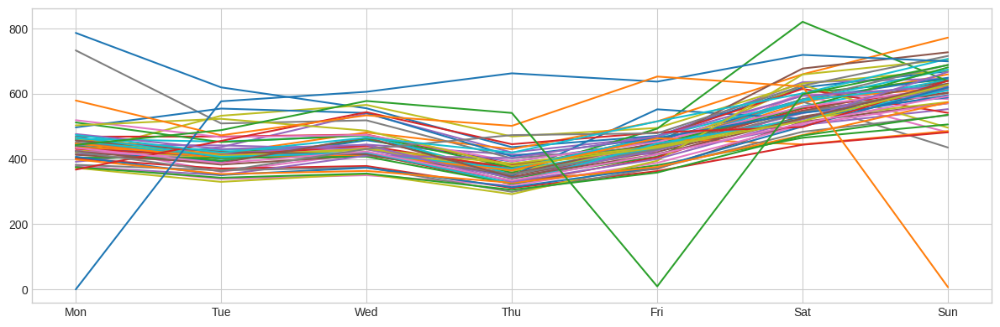

In [10]:
import numpy as np

grouped = average_sales.groupby(pd.Grouper(freq="W"))
weekly = pd.DataFrame(index=["Mon", "Tue", "Wed", "Thu", "Fri", "Sat", "Sun"])
for time, group in grouped:
    if len(group.values) == 6:
        weekly[time.week] = np.insert(group.values, 0, 0)
    elif len(group.values) == 7:
        weekly[time.week] = group.values

weekly.plot(legend=False);

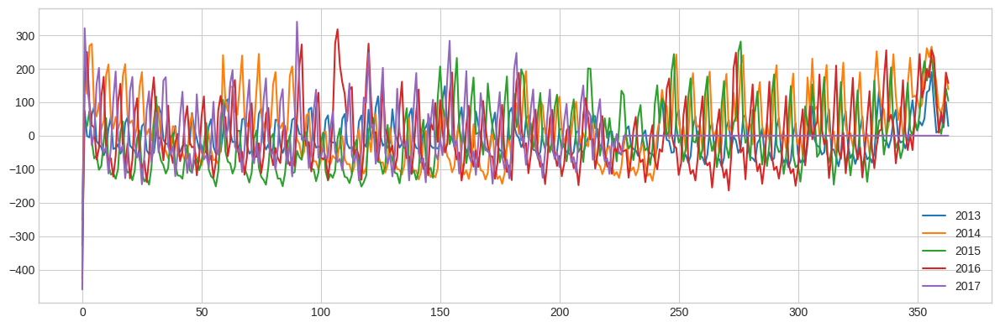

In [11]:
trend = average_sales.rolling(window=365, min_periods=135, center=True).mean()

grouped = (average_sales - trend).groupby(pd.Grouper(freq="Y"))
yearly = pd.DataFrame()
for time, group in grouped:
    if len(group) == 365:
        # Exclude leap days.
        group.drop(f"{time}-02-29", inplace=True)
    elif len(group) < 364:
        # Fill out missing values for the year towards the end.
        group = pd.concat(
            [
                group,
                pd.Series(
                    data=0,
                    index=pd.date_range(
                        (group.index[-1] + 2).strftime("%Y-%m-%d"), f"{time}-12-31"
                    ),
                ),
            ]
        )
    yearly[time] = group.values

yearly.plot();

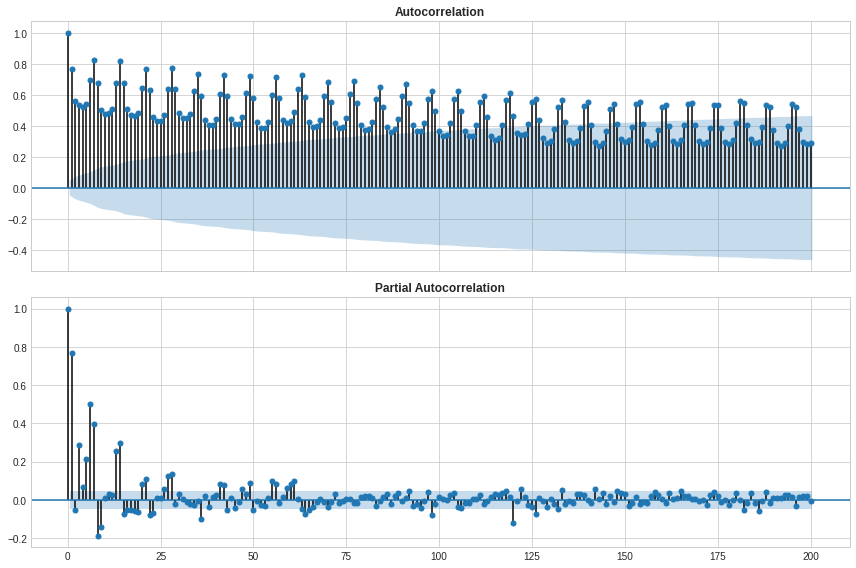

In [ ]:
import statsmodels.api as sm

fig, axes = plt.subplots(2, 1, sharex=True, figsize=(12, 8))
sm.tsa.graphics.plot_acf(average_sales, ax=axes[0], lags=200, adjusted=True, fft=True)
sm.tsa.graphics.plot_pacf(average_sales, ax=axes[1], lags=200);

In [60]:
from sklearn.linear_model import LinearRegression


def cross_validation(
    X,
    y,
    lookback=90,
    horizon=30,
    k=6,
    seed=42,
    plot=False,
):
    rng = np.random.default_rng(seed=seed)
    val_idx = rng.integers(low=lookback, high=len(y) - horizon, size=k)
    metrics = pd.DataFrame([], columns=["mae", "mse", "mape"])
    fig, axes = plt.subplots(k, figsize=(12, 4 * k))

    for i, ax in zip(val_idx, axes):
        X_train, X_val = X[0:i], X[i : i + horizon]
        y_train = y.iloc[0:i].rename("Train")
        y_val = y.iloc[i : i + horizon].rename("Validation")
        lr = LinearRegression().fit(X_train, y_train)
        y_pred = pd.Series(lr.predict(X_train), index=y_train.index, name="Prediction")
        y_fore = pd.Series(lr.predict(X_val), index=y_val.index, name="Forecast")
        metrics.loc[f"{y_val.index[0]}_{y_val.index[-1]}"] = pd.Series(
            {
                "mae": mean_absolute_error(y_val, y_fore),
                "mse": mean_squared_error(y_val, y_fore),
                "mape": mean_absolute_percentage_error(y_val, y_fore),
                "mrpd": mean_relative_percent_difference(y_val, y_fore),
            },
        )

        if plot:
            y_train.plot(ax=ax, **plot_params)
            y_val.plot(ax=ax, style=".-", color="blue", alpha=0.5)
            y_pred.plot(ax=ax, color="cyan")
            y_fore.plot(ax=ax, color="magenta")
            ax.legend()

    return metrics


def mean_relative_percent_difference(y_true, y_pred):
    return (2 * (y_pred - y_true) / (np.abs(y_pred) + np.abs(y_true))).mean()

In [50]:
from statsmodels.tsa.deterministic import DeterministicProcess

y_train = average_sales.iloc[:-30]
y_test = average_sales.iloc[-30:]

det_proc = DeterministicProcess(
    index=y_train.index,
    constant=True,
    order=1,
    drop=True,
)
X_train = det_proc.in_sample()
X_test = det_proc.out_of_sample(steps=30)

In [59]:
from sklearn.linear_model import LinearRegression
from sklearn.metrics import (
    mean_absolute_error,
    mean_absolute_percentage_error,
    mean_squared_error,
)
from sklearn.preprocessing import StandardScaler

scaler = StandardScaler()
X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)

lr = LinearRegression().fit(X_train, y_train)
y_pred = lr.predict(X_train)
y_fore = lr.predict(X_test)

print(
    f"Train MAE: {mean_absolute_error(y_train, y_pred)}, "
    f"Val MAE: {mean_absolute_error(y_test, y_fore)}\n"
    f"Train MSE: {mean_squared_error(y_train, y_pred)}, "
    f"Val MSE: {mean_squared_error(y_test, y_fore)}\n"
    f"Train MAPE: {mean_absolute_percentage_error(y_train, y_pred)}, "
    f"Val MAPE: {mean_absolute_percentage_error(y_test, y_fore)}\n"
    f"Train MRPD: {mean_relative_percent_difference(y_train, y_pred)}, "
    f"Val MRPD: {mean_relative_percent_difference(y_test, y_fore)}"
)

Train MAE: 71.89509998805208, Val MAE: 78.86111462320915
Train MSE: 8381.854100561854, Val MSE: 7777.291679977978
Train MAPE: 0.41870070625552686, Val MAPE: 0.18132675058957345
Train MRPD: 0.03438993309540677, Val MRPD: 0.12091818159518394


mae       82.582293
mse     9441.414252
mape       0.269099
dtype: float64

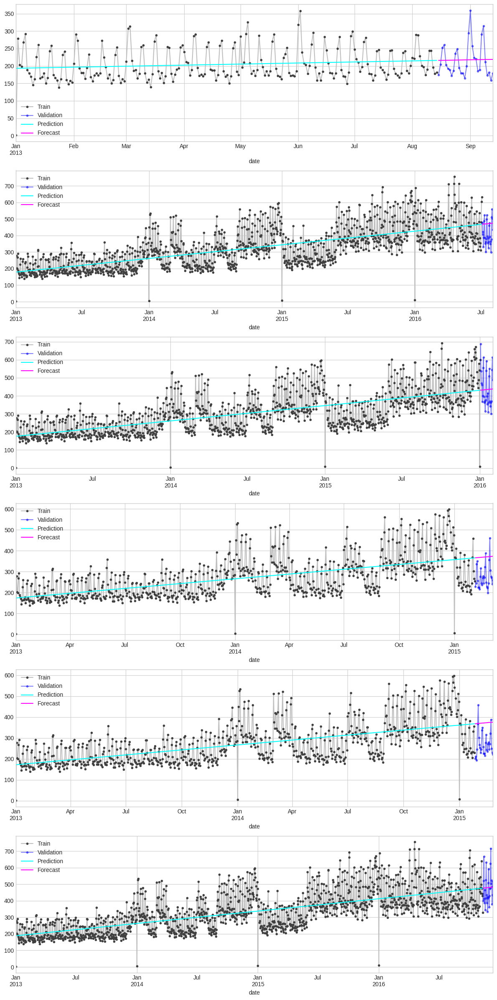

In [61]:
metrics = cross_validation(X_train, y_train, plot=True)
metrics.mean()

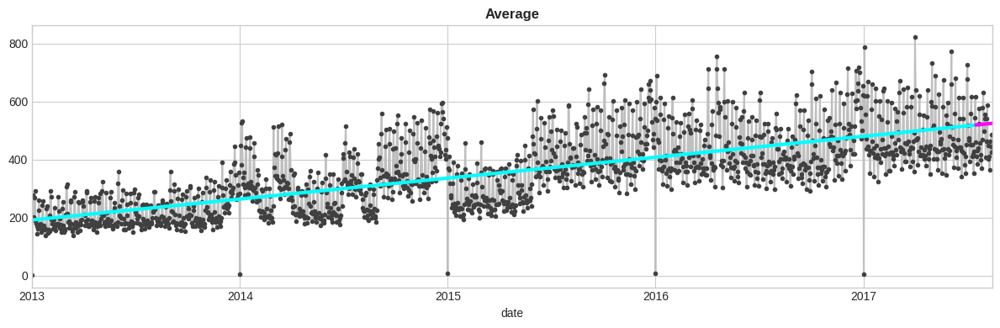

In [53]:
sales_ax = average_sales.plot(**plot_params, title="Average")
sales_ax.plot(y_train.index, y_pred, color="cyan", lw=3)
sales_ax.plot(y_test.index, y_fore, color="magenta", lw=3)

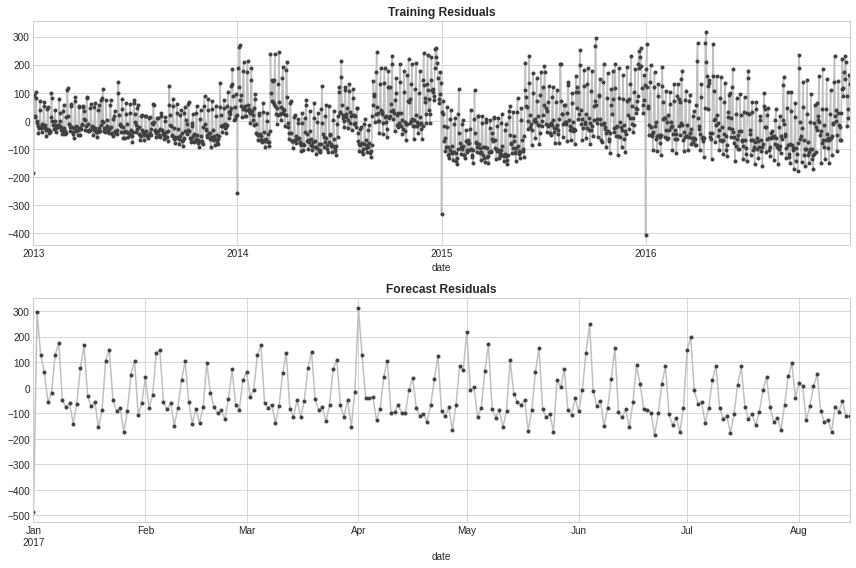

In [ ]:
fig, axes = plt.subplots(2, 1, figsize=(12, 8))
(y_train - y_pred).plot(ax=axes[0], **plot_params, title="Training Residuals")
(y_test - y_fore).plot(ax=axes[1], **plot_params, title="Forecast Residuals");

/tmp/nix-shell.vx4hnp/ipykernel_303860/4192000121.py:2: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  average_feats = dataset.groupby("date").mean()[["sales", "dcoilwtico"]]


,sales,dcoilwtico
sales,1.000000,-0.606939
dcoilwtico,-0.606939,1.000000


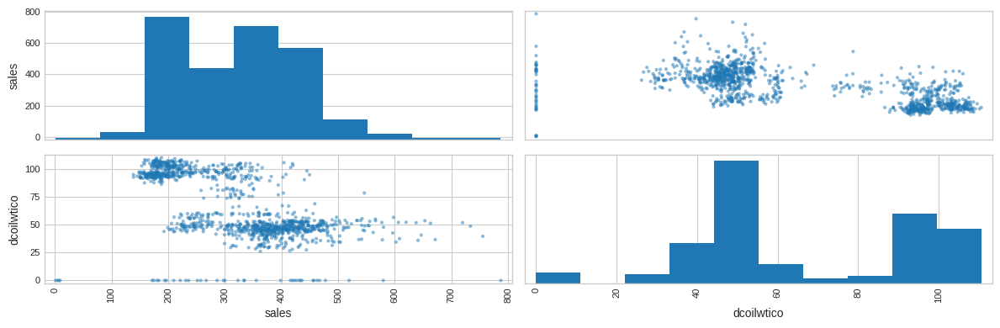

In [70]:
dataset = store_exp.merge(oil_prices, left_index=True, right_index=True)
average_feats = dataset.groupby("date").mean()[["sales", "dcoilwtico"]]
display(average_feats.corr())
pd.plotting.scatter_matrix(average_feats);